**Author : Sercan SATICI, Kasım 2020**

**Kimlik Doğrulama**
Drive'ın kimlik doğrulaması gerçekleştirilir.

In [1]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 144793 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.23-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.23-0ubuntu1~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.23-0ubuntu1~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope

**Mount İşlemi**
 Drive mount edilir.

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


**Çalışma Ortamının Hazırlanması**
Çalışma dizinine set olunur.

In [2]:
import os
os.chdir("/content/drive/My Drive/BitirmeTezi/DnCNN")
!ls

data		   main_test.py      models	  readme.png
data_generator.py  main_train.ipynb  __pycache__  results
main_test.ipynb    main_train.py     README.md


# **Test**

**Kütüphanelerin Yüklenmesi**

In [3]:
import argparse
import os, time, datetime
#import PIL.Image as Image
import numpy as np
from keras.models import load_model, model_from_json
from skimage.measure import compare_psnr, compare_ssim
from skimage.io import imread, imsave

**Parametrelerin Ayarlanması**

In [4]:
def parse_args():
    parser = argparse.ArgumentParser()
    parser.add_argument('--set_dir', default='data/Test', type=str, help='directory of test dataset')
    parser.add_argument('--set_names', default=['SercanSatici','BM3DSet','Set68','Set12'], type=list, help='name of test dataset')
    parser.add_argument('--sigma', default=25, type=int, help='noise level')
    parser.add_argument('--model_dir', default=os.path.join('models','DnCNN_sigma25'), type=str, help='directory of the model')
    parser.add_argument('--model_name', default='model_001.hdf5', type=str, help='the model name')
    parser.add_argument('--result_dir', default='results', type=str, help='directory of results')
    parser.add_argument('--save_result', default=1, type=int, help='save the denoised image, 1 or 0')

    parser.add_argument('-f')#parse edebilmesi için, dummyParser argument eklenmiştir, SytemExit:2 hatasının önüne geçilmiştir.

    return parser.parse_args()

**İmgeden Tensor Oluşturma**
Çok kanallı matris değerleri, vektöre atanır.

In [5]:
def to_tensor(img):
    if img.ndim == 2:
        return img[np.newaxis,...,np.newaxis]
    elif img.ndim == 3:
        return np.moveaxis(img,2,0)[...,np.newaxis]

**Tensorden İmge Oluşturma**
Vektör değerleri çok kanallı matris formatına getirilir.

In [6]:
def from_tensor(img):
    return np.squeeze(np.moveaxis(img[...,0],0,-1))

**Loglama**
Tarih/Saat bilgilerini ekrana print etmek için kullanılmaktadır.

In [7]:
def log(*args,**kwargs):
     print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S:"),*args,**kwargs)

**Sonuç Kayıtlama**
İlgili dizine result imgeleri kaydeder.

In [8]:
def save_result(result,path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt','.dlm'):
        np.savetxt(path,result,fmt='%2.4f')
    else:
        imsave(path,np.clip(result,0,1))

**İmge Görüntüleme**

In [9]:
def show(x,title=None,cbar=False,figsize=None):
    import matplotlib.pyplot as plt
    plt.figure(figsize=figsize)
    plt.imshow(x,interpolation='nearest',cmap='gray')
    if title:
        plt.title(title)
    if cbar:
        plt.colorbar()
    plt.show()

## **Test Süreci**

2020-11-27 14:24:57: load trained model
SercanSatici : DnCNNTest005.jpg : 6.4209 second


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:42: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


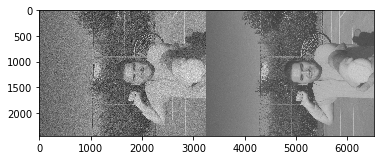

SercanSatici : DnCNNTest001.jpg : 1.5366 second


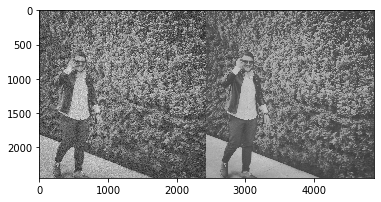

SercanSatici : DnCNNTest004.jpg : 0.5990 second


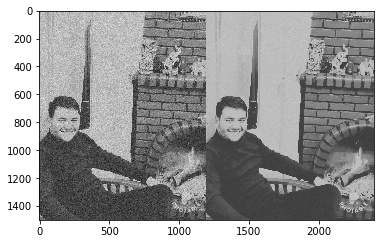

SercanSatici : DnCNNTest002.jpg : 0.2433 second


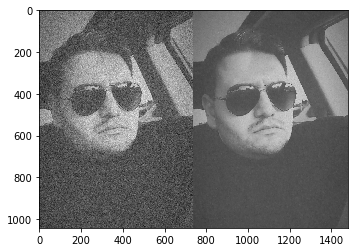

SercanSatici : DnCNNTest003.jpg : 0.4851 second


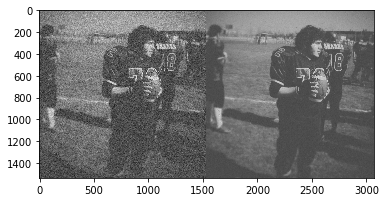

SercanSatici : DnCNNTest008.jpg : 2.2412 second


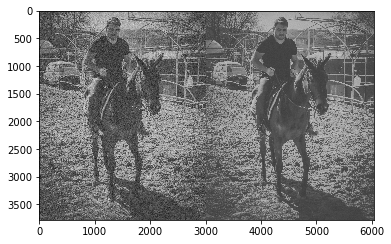

SercanSatici : DnCNNTest007.jpg : 0.1390 second


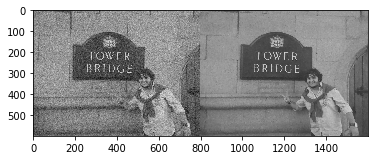

SercanSatici : DnCNNTest006.jpg : 0.6847 second


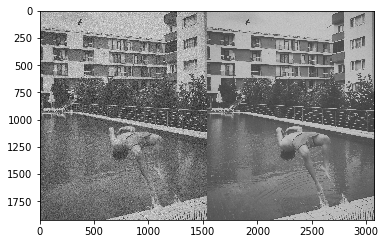

SercanSatici : DnCNNTest009.jpg : 2.0311 second


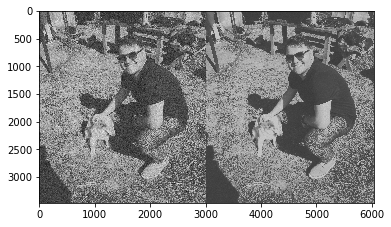

SercanSatici : DnCNNTest010.jpg : 0.5946 second


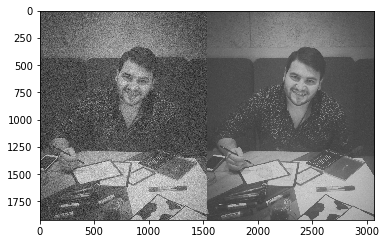

SercanSatici : DnCNNTest011.jpg : 0.1654 second


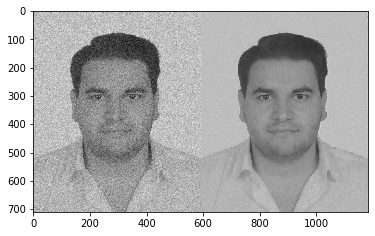

SercanSatici : DnCNNTest012.jpg : 0.8036 second


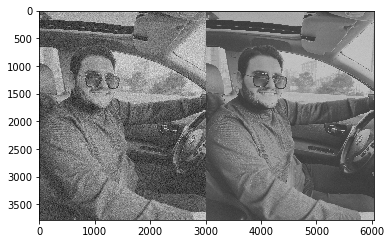

SercanSatici : DnCNNTest013.jpg : 1.2699 second


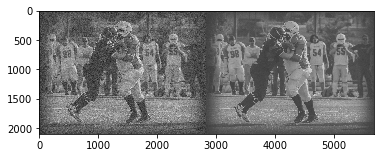

SercanSatici : DnCNNTest014.jpg : 1.3319 second


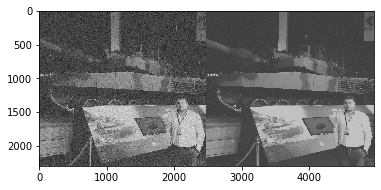

SercanSatici : DnCNNTest015.jpg : 1.7675 second


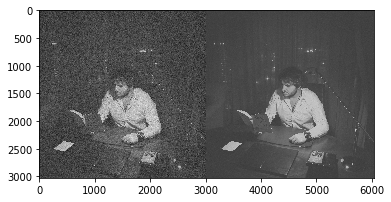

2020-11-27 14:25:55: Datset: SercanSatici 
  PSNR = 30.25dB, SSIM = 0.9045
   BM3DSet : DnCNNTest022house.png : 0.0615 second


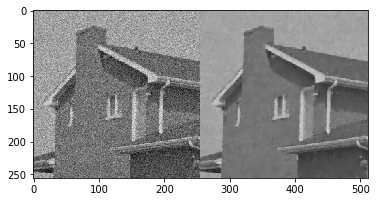

   BM3DSet : DnCNNTest016barbara.png : 0.1126 second


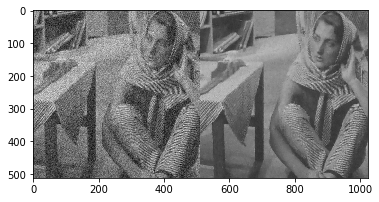

   BM3DSet : DnCNNTest026peppers256.png : 0.0363 second


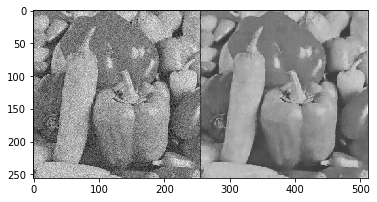

   BM3DSet : DnCNNTest017boat.png : 0.0502 second


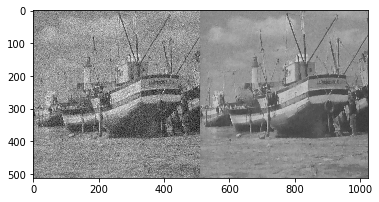

   BM3DSet : DnCNNTest018Cameraman256.png : 0.0371 second


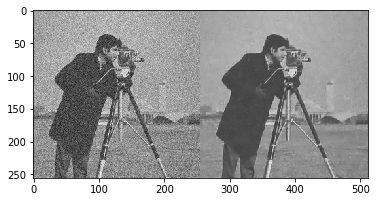

   BM3DSet : DnCNNTest023Lena512.png : 0.0536 second


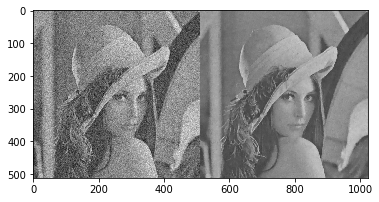

   BM3DSet : DnCNNTest020_fingerprint.png : 0.0507 second


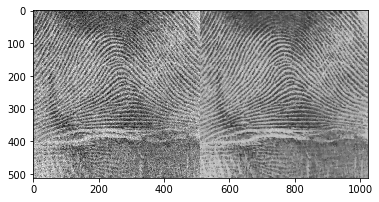

   BM3DSet : DnCNNTest019couple.png : 0.0550 second


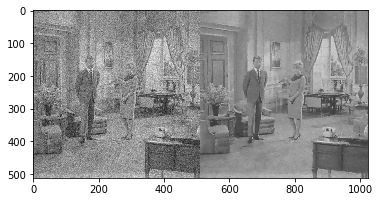

   BM3DSet : DnCNNTest021hill.png : 0.0512 second


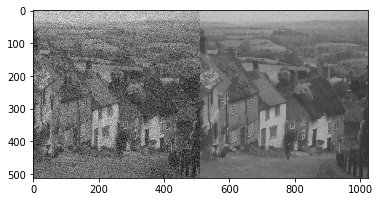

   BM3DSet : DnCNNTest024man.png : 0.0548 second


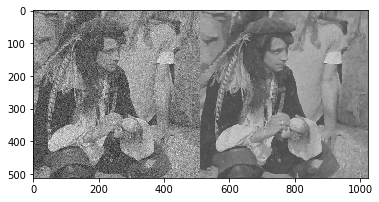

   BM3DSet : DnCNNTest025montage.png : 0.0409 second


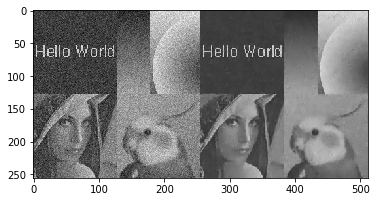

2020-11-27 14:26:02: Datset: BM3DSet    
  PSNR = 28.63dB, SSIM = 0.8871
     Set68 : test027.png : 0.0999 second


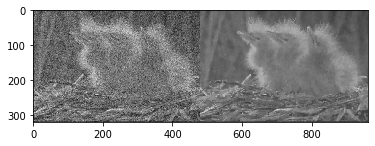

     Set68 : test058.png : 0.0469 second


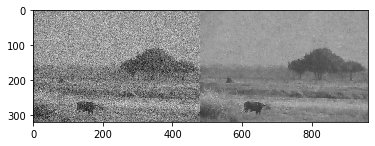

     Set68 : test063.png : 0.0457 second


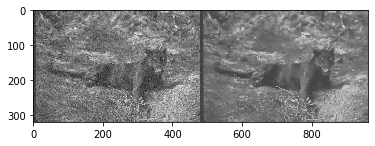

     Set68 : test044.png : 0.0460 second


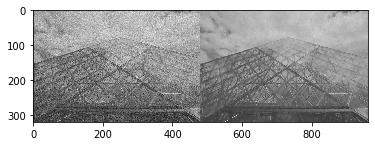

     Set68 : test020.png : 0.0453 second


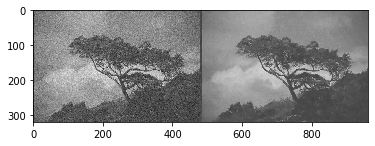

     Set68 : test021.png : 0.1031 second


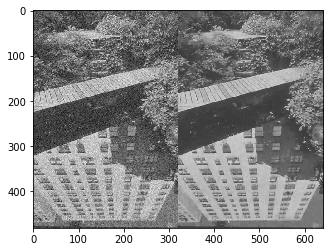

     Set68 : test025.png : 0.0494 second


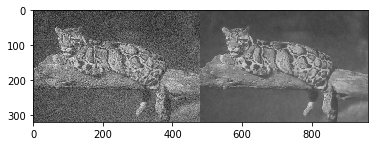

     Set68 : test036.png : 0.0500 second


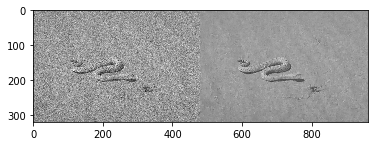

     Set68 : test007.png : 0.0501 second


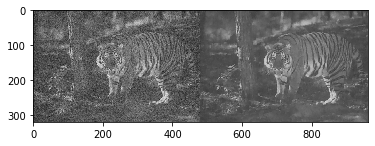

     Set68 : test002.png : 0.0503 second


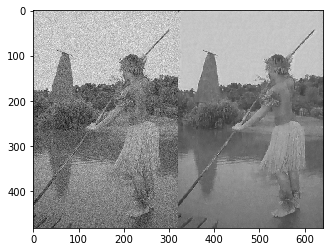

     Set68 : test050.png : 0.0463 second


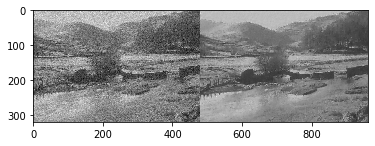

     Set68 : test026.png : 0.0458 second


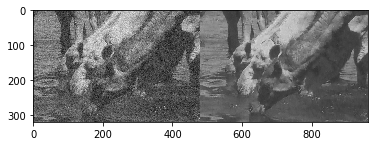

     Set68 : test034.png : 0.0480 second


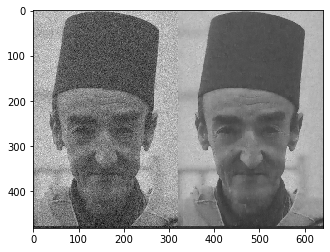

     Set68 : test017.png : 0.0471 second


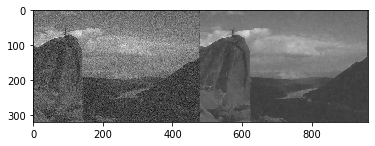

     Set68 : test049.png : 0.0471 second


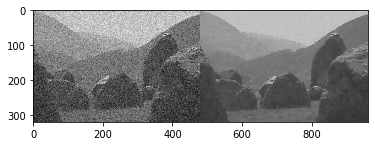

     Set68 : test004.png : 0.0498 second


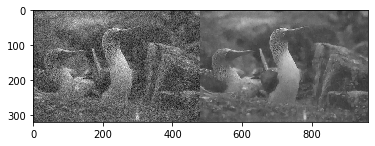

     Set68 : test047.png : 0.1943 second


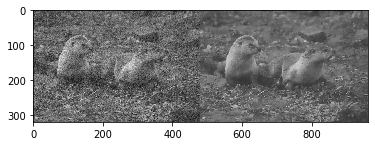

     Set68 : test022.png : 0.0457 second


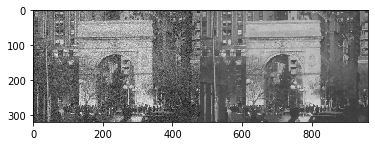

     Set68 : test031.png : 0.0484 second


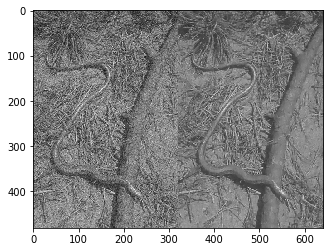

     Set68 : test010.png : 0.0495 second


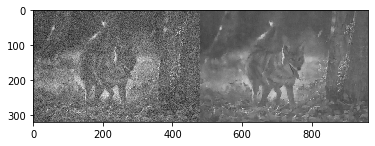

     Set68 : test016.png : 0.0458 second


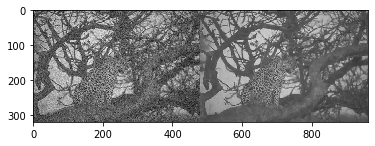

     Set68 : test018.png : 0.0494 second


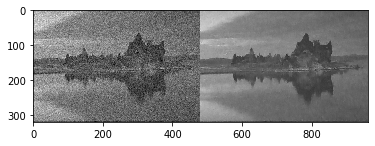

     Set68 : test068.png : 0.0462 second


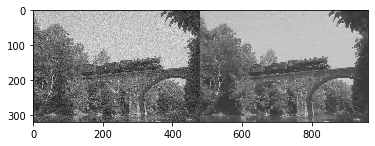

     Set68 : test065.png : 0.0469 second


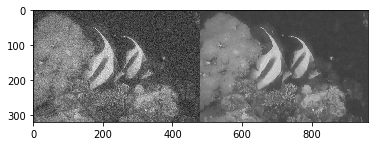

     Set68 : test009.png : 0.0457 second


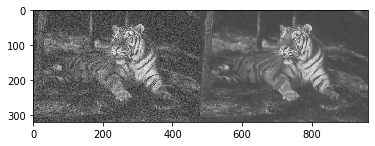

     Set68 : test060.png : 0.0465 second


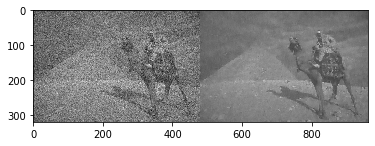

     Set68 : test019.png : 0.0487 second


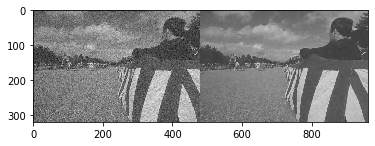

     Set68 : test038.png : 0.0514 second


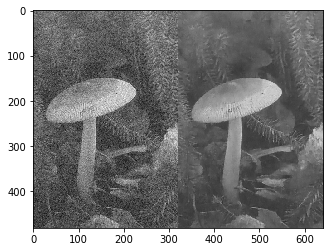

     Set68 : test051.png : 0.0472 second


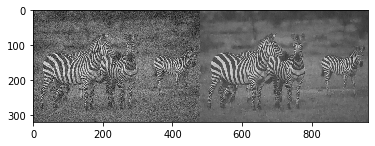

     Set68 : test024.png : 0.0468 second


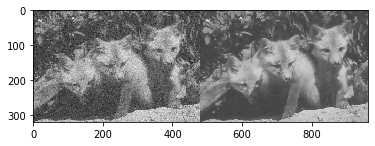

     Set68 : test043.png : 0.0463 second


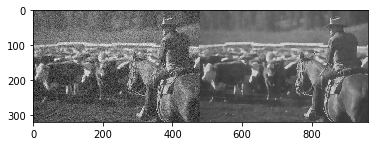

     Set68 : test039.png : 0.0479 second


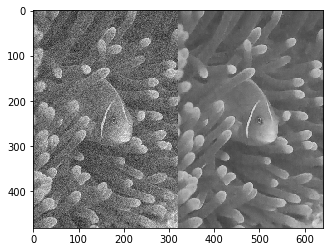

     Set68 : test042.png : 0.0465 second


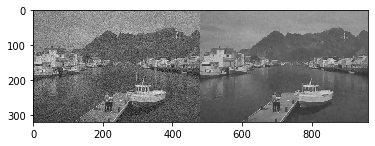

     Set68 : test062.png : 0.0472 second


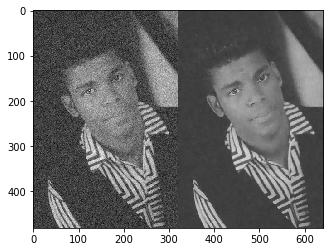

     Set68 : test067.png : 0.0476 second


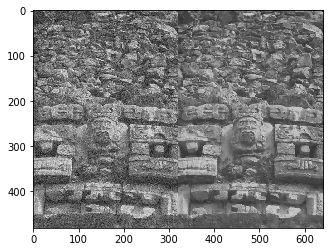

     Set68 : test055.png : 0.0471 second


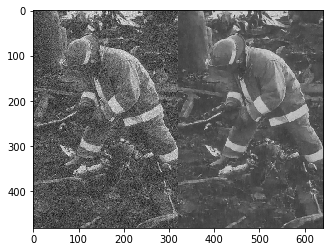

     Set68 : test040.png : 0.0463 second


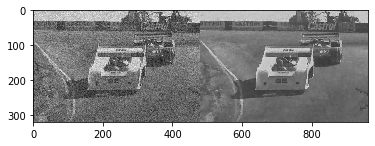

     Set68 : test053.png : 0.0465 second


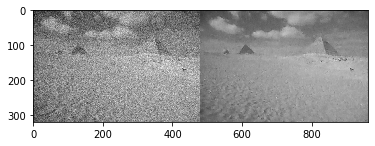

     Set68 : test041.png : 0.0464 second


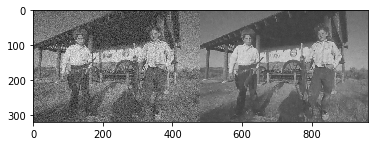

     Set68 : test001.png : 0.0481 second


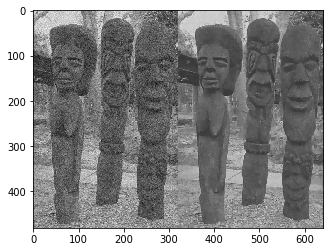

     Set68 : test061.png : 0.0471 second


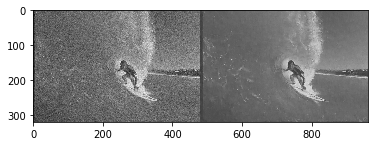

     Set68 : test011.png : 0.0470 second


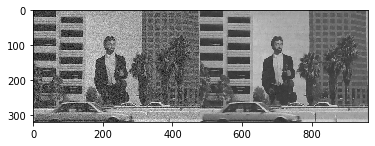

     Set68 : test064.png : 0.0521 second


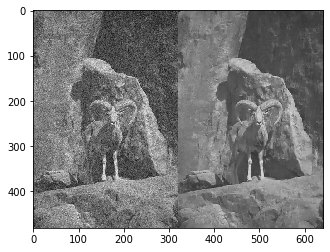

     Set68 : test056.png : 0.0466 second


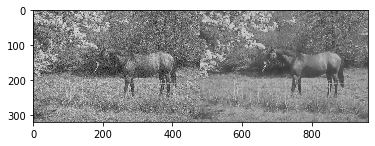

     Set68 : test059.png : 0.0467 second


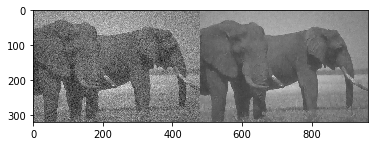

     Set68 : test032.png : 0.1962 second


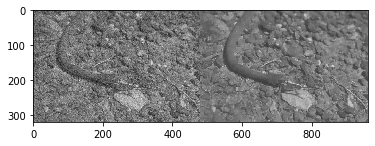

     Set68 : test045.png : 0.0469 second


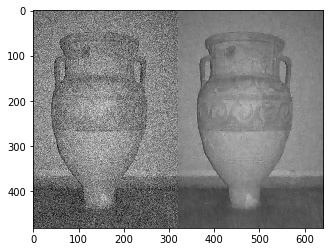

     Set68 : test023.png : 0.0476 second


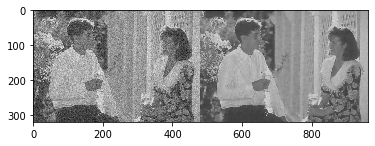

     Set68 : test048.png : 0.0455 second


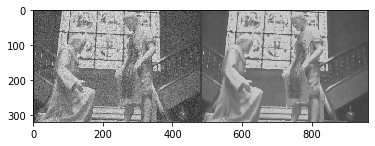

     Set68 : test029.png : 0.0513 second


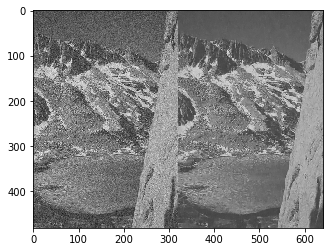

     Set68 : test028.png : 0.0506 second


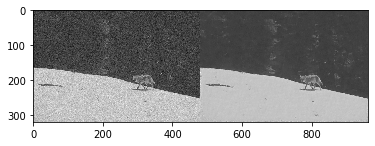

     Set68 : test037.png : 0.0475 second


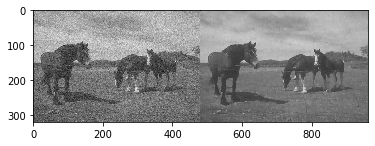

     Set68 : test046.png : 0.0466 second


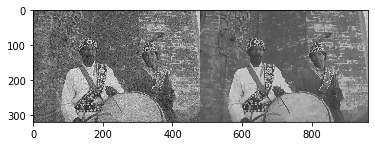

     Set68 : test014.png : 0.0501 second


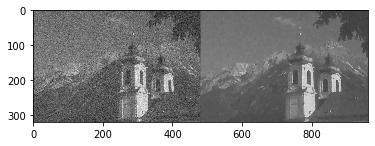

     Set68 : test030.png : 0.0464 second


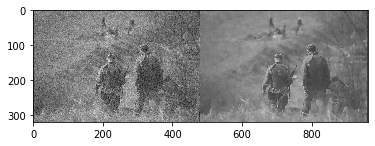

     Set68 : test033.png : 0.0458 second


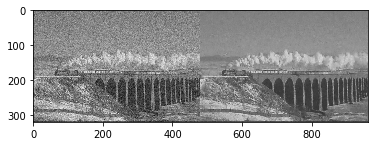

     Set68 : test015.png : 0.0495 second


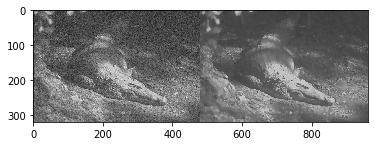

     Set68 : test054.png : 0.0488 second


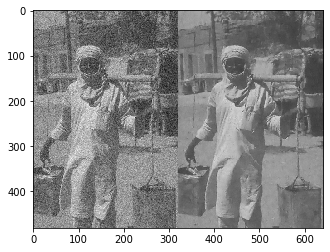

     Set68 : test035.png : 0.0462 second


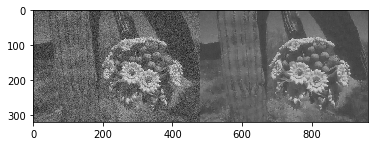

     Set68 : test057.png : 0.0463 second


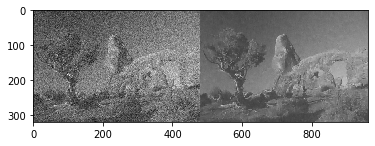

     Set68 : test052.png : 0.0475 second


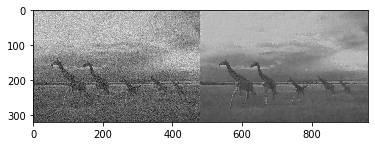

     Set68 : test012.png : 0.0475 second


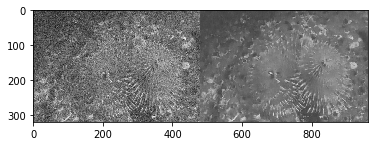

     Set68 : test008.png : 0.0470 second


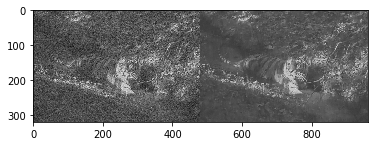

     Set68 : test066.png : 0.0473 second


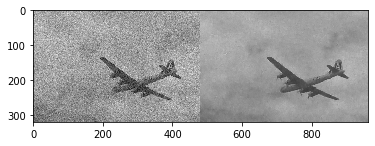

     Set68 : test013.png : 0.0472 second


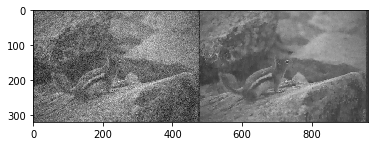

     Set68 : test005.png : 0.0458 second


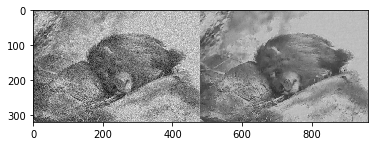

     Set68 : test006.png : 0.0468 second


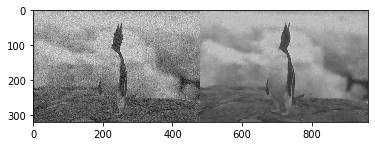

     Set68 : test003.png : 0.0483 second


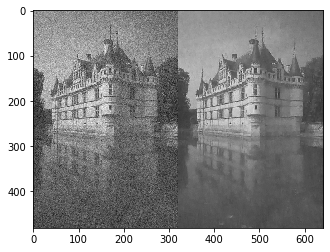

2020-11-27 14:27:12: Datset: Set68      
  PSNR = 27.84dB, SSIM = 0.8661
     Set12 :     11.png : 0.0520 second


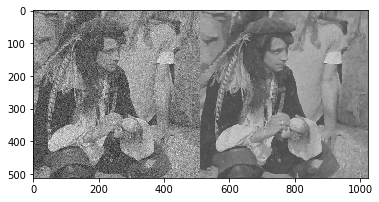

     Set12 :     04.png : 0.0385 second


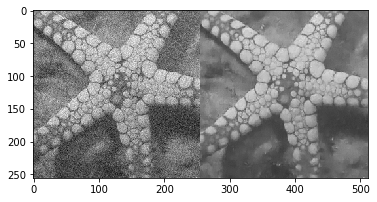

     Set12 :     02.png : 0.0421 second


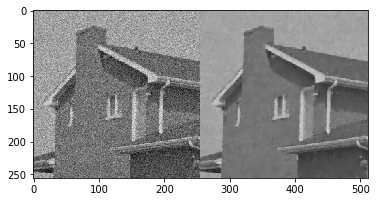

     Set12 :     09.png : 0.0519 second


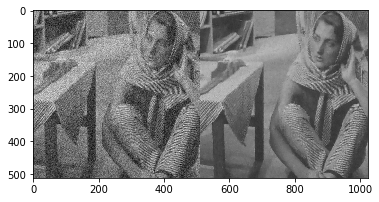

     Set12 :     10.png : 0.0526 second


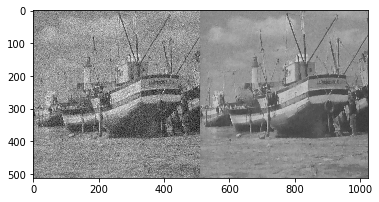

     Set12 :     01.png : 0.0394 second


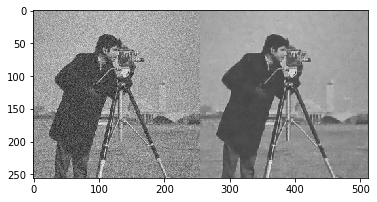

     Set12 :     03.png : 0.1919 second


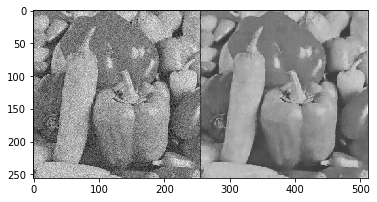

     Set12 :     06.png : 0.0382 second


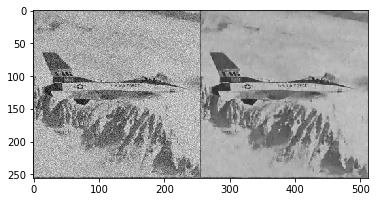

     Set12 :     12.png : 0.0539 second


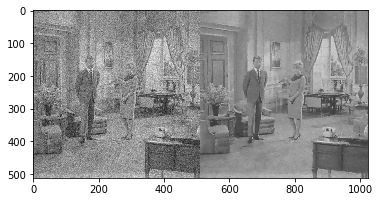

     Set12 :     08.png : 0.0509 second


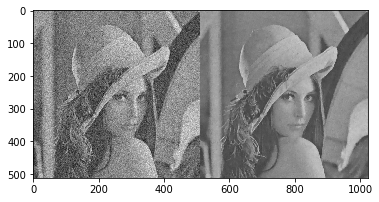

     Set12 :     05.png : 0.0377 second


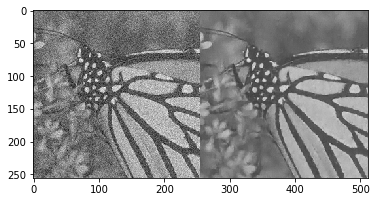

     Set12 :     07.png : 0.0405 second


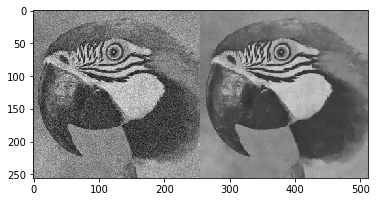

2020-11-27 14:27:24: Datset: Set12      
  PSNR = 28.50dB, SSIM = 0.8890


In [10]:
if __name__ == '__main__':    
    
    args = parse_args()#parametreler parse edilerek args değişkeninde saklanır.
    
    if not os.path.exists(os.path.join(args.model_dir, args.model_name)):#eğer path mevcut değilse
        # load json and create model
        json_file = open(os.path.join(args.model_dir,'model.json'), 'r')#ilgili dizinde yer alan ".json" dosyası açılır
        loaded_model_json = json_file.read()#".json" dosyası okunarak, model yüklenir
        json_file.close()#".json" kaparılır
        model = model_from_json(loaded_model_json)#".json" dosyasından yüklenen model, model değişkenine atanir
        # load weights into new model
        model.load_weights(os.path.join(args.model_dir,'model.h5'))#model ağırlıkları yüklenir
        log('load trained model on Train400 dataset')#log
    else:#path mevcut ise
        model = load_model(os.path.join(args.model_dir, args.model_name),compile=False)#model yüklenir
        log('load trained model')#log

    if not os.path.exists(args.result_dir):#sonuç kayıt dizini yok ise
        os.mkdir(args.result_dir)#sonuç kayıt dizini oluşturulur
        
    for set_cur in args.set_names:  
        
        if not os.path.exists(os.path.join(args.result_dir,set_cur)):
            os.mkdir(os.path.join(args.result_dir,set_cur))
        psnrs = []#psnr değerlerinin saklandığı değişken
        ssims = [] #ssim değerlerinin saklandığı değişken
        
        for im in os.listdir(os.path.join(args.set_dir,set_cur)): 
            if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):
                #x = np.array(Image.open(os.path.join(args.set_dir,set_cur,im)), dtype='float32') / 255.0
                x = np.array(imread(os.path.join(args.set_dir,set_cur,im)), dtype=np.float32) / 255.0 #imge okunur, x'e atanir
                np.random.seed(seed=0) # for reproducibility
                y = x + np.random.normal(0, args.sigma/255.0, x.shape) # y = x + n , AWGN gürültüsü eklenerek y oluşturulur
                y = y.astype(np.float32) #4[byte] float'a cast edilir
                y_  = to_tensor(y)#matris, tensor haline çevirilir
                start_time = time.time()#başlangıç zamanı
                x_ = model.predict(y_) #kestirim yapılarak, gürültü "x_" değişkendi predict edilir
                elapsed_time = time.time() - start_time #geçen süre
                print('%10s : %10s : %2.4f second'%(set_cur,im,elapsed_time))#süre ekrana yazdirilir
                x_=from_tensor(x_)#tensor, matrise çevirilir
                psnr_x_ = compare_psnr(x, x_)#PSNR
                ssim_x_ = compare_ssim(x, x_)#SSIM
                if args.save_result:#sonuç kayıt açıksa (default:1)
                    name, ext = os.path.splitext(im)#imge ismi
                    show(np.hstack((y,x_))) #imgeyi göster
                    save_result(x_,path=os.path.join(args.result_dir,set_cur,name+'_dncnn'+ext)) #denoised imge kayıtlanir
                psnrs.append(psnr_x_)
                ssims.append(ssim_x_)
    
        psnr_avg = np.mean(psnrs)#ortalama PSNR
        ssim_avg = np.mean(ssims)#ortalama SSIM
        psnrs.append(psnr_avg)
        ssims.append(ssim_avg)
        
        if args.save_result:#sonuç kayıt açıksa (default:1)
            save_result(np.hstack((psnrs,ssims)),path=os.path.join(args.result_dir,set_cur,'results.txt'))#sonuçlar ".txt" dosyasina loglanir
            
        log('Datset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))#log